In [1]:
import json
import terminaltables
import numpy as np
import pandas as pd
import torch

import matplotlib.pyplot as plt

from sklearn.manifold import TSNE
from pathlib import Path
from pprint import pformat
from decord import VideoReader
from PIL import Image, ImageDraw
from IPython.display import Image as IPImage
from collections import Counter
from tqdm import tqdm

In [3]:
thresholds = np.array([0.3, 0.5])
topK = np.array([1, 5])

p_train_pred = Path('/data/soyeonhong/GroundVQA/predictions/VLG_OpenQA_train.json')    
p_val_pred = Path('/data/soyeonhong/GroundVQA/predictions/VLG_OpenQA_val.json')
p_train_ann = Path('/data/soyeonhong/GroundVQA/data/unified/annotations.NLQ_train.json')
p_val_ann = Path('/data/soyeonhong/GroundVQA/data/unified/annotations.NLQ_val.json')
p_clips_dir = Path('/data/datasets/ego4d_data/v2/clips_320p-non_official')
p_object_dir = Path('/data/soyeonhong/universal-ner/NLQ-query-uniner-extracted-object/query_uniner_outputs')
p_action_dir = Path('/data/soyeonhong/universal-ner/NLQ-query-uniner-extracted-action/query_uniner_outputs')

all_train_preds = json.loads(p_train_pred.read_text())
all_val_preds = json.loads(p_val_pred.read_text())
all_train_anns = json.loads(p_train_ann.read_text())
all_val_anns = json.loads(p_val_ann.read_text())

print(pformat(all_val_preds, sort_dicts=False, compact=True)[:1000])
print(pformat(all_val_anns, sort_dicts=False, compact=True)[:1000])

[{'query_id': '95441b96-e2ef-4e61-b74f-10ebc2da5b4e_0',
  'pred_answer': 'In the fire gun clip, I put the fire gun clip in the fire '
                 'gun clip and then put the fire gun clip back in the fire gun '
                 'clip.',
  'gt_answer': 'None',
  'pred_window': [[77.33224487304688, 79.6456298828125],
                  [27.55120849609375, 29.15144920349121],
                  [57.237327575683594, 58.689720153808594],
                  [120.89195251464844, 122.30086517333984],
                  [7.690918922424316, 9.33899211883545]],
  'gt_window': {'clip_start_sec': 28.60389,
                'clip_end_sec': 29.013,
                'video_start_sec': 28.603889600000002,
                'video_end_sec': 29.012999600000004,
                'video_start_frame': 857,
                'video_end_frame': 870,
                'template': 'Place: Where did I put X?',
                'query': 'Where did i put the fire gun ?',
                'slot_x': 'fire gun ',
              

In [4]:
def process_predictions_and_annotations(all_preds, all_anns, p_object_dir, p_action_dir):

    quid2pred, quid2info, quid2template = {}, {}, {}
    quid2object, quid2action, quid2ann = {}, {}, {}

    # Process predictions
    for pred in all_preds:
        quid = pred['query_id']
        
        quid2pred[quid] = pred['pred_window']
        quid2info[quid] = pred['gt_window']
        
        if pred['gt_window']['template'] is not None:
            quid2template[quid] = pred['gt_window']['template']
        else:
            quid2template[quid] = 'No Template'
        
        p_object_json = p_object_dir / f'{quid}.json'
        p_action_json = p_action_dir / f'{quid}.json'
        
        obj = json.loads(p_object_json.read_text())[0]['entities']['values']
        action = json.loads(p_action_json.read_text())[0]['entities']['values']
        
        quid2object[quid] = obj
        quid2action[quid] = action

    # Process annotations
    for ann in all_anns:
        quid = ann['sample_id']
        quid2ann[quid] = ann
    
    return quid2pred, quid2info, quid2template, quid2object, quid2action, quid2ann


In [5]:
val_quid2pred, val_quid2info, val_quid2template, val_quid2object, val_quid2action, val_quid2ann = process_predictions_and_annotations(all_val_preds, all_val_anns, p_object_dir, p_action_dir)

In [6]:
def compute_IoU(preds, gts):
    gts = np.array(gts)[:None]
    preds = np.array(preds)[:None]
    inters = np.maximum(0, np.minimum(preds[..., 1], gts[..., 1]) - np.maximum(preds[..., 0], gts[..., 0]))
    unions = np.maximum(preds[..., 1], gts[..., 1]) - np.minimum(preds[..., 0], gts[..., 0])
    ious = inters / (unions + 1e-6)  # N x 5
    
    return ious

def compute_result(test_pred, test_gt):
    overlap = compute_IoU(test_pred, test_gt)

    results = [[[] for _ in topK] for _ in thresholds]
    for tt, threshold in enumerate(thresholds):
        for rr, KK in enumerate(topK):
            results[tt][rr].append((overlap > threshold)[:KK].any())
            
    display_data = [
                [f"Rank@{ii}\nmIoU@{jj}" for ii in topK for jj in thresholds]
            ]

    display_data.append(
                [
                    f"{results[jj][ii][0]}"
                    for ii in range(len(topK))
                    for jj in range(len(thresholds))
                ]
            )
    table = terminaltables.AsciiTable(display_data)
    for ii in range(len(thresholds) * len(topK)):
        table.justify_columns[ii] = "center"
        
    return table.table, overlap

def get_pillow_images(p_clip, idxs):
    peal = False
    if isinstance(idxs, int):
        idxs = [idxs]
        peal = True
    vr = VideoReader(str(p_clip), num_threads=0)
    frames = vr.get_batch(idxs).asnumpy()
    frames = [Image.fromarray(f) for f in frames]
    if peal:
        return frames[0]
    else:
        return frames

### Visualize

72f3eb4a-71e7-4301-ac6b-9886f7605789 c00137a4-eed1-4394-87cd-3a79a41f04e6_1
What machine did I use?
Template: Objects: What X did I Y?
Object: ['machine']
Action: ['']
+----------+----------+----------+----------+
|  Rank@1  |  Rank@1  |  Rank@5  |  Rank@5  |
| mIoU@0.3 | mIoU@0.5 | mIoU@0.3 | mIoU@0.5 |
+----------+----------+----------+----------+
|  False   |  False   |  False   |  False   |
+----------+----------+----------+----------+
<GT>
GT: 59.61 ~ 118.80


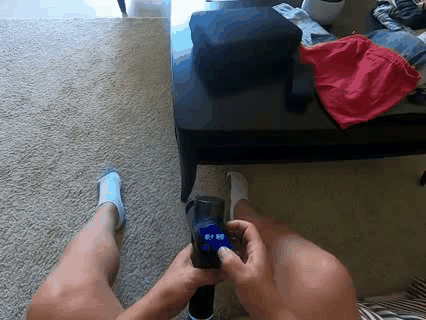

<Pred 1>
Timestamp: 1.46 ~ 4.80, IoU: 0.00


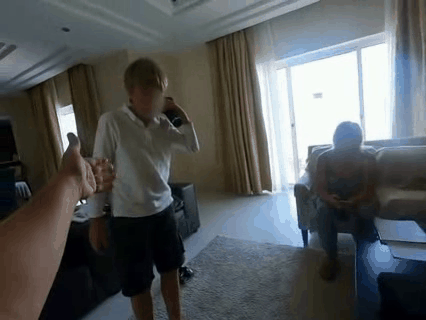

<Pred 2>
Timestamp: 363.84 ~ 374.21, IoU: 0.00


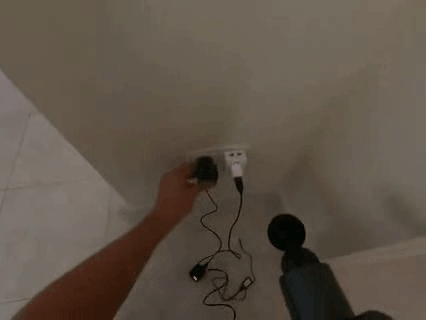

<Pred 3>
Timestamp: 354.41 ~ 359.28, IoU: 0.00


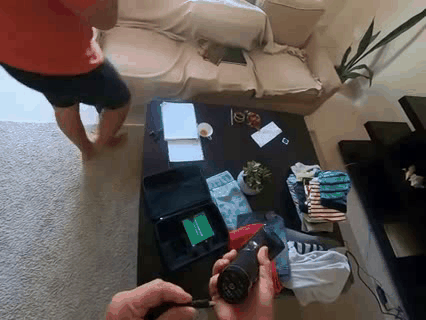

<Pred 4>
Timestamp: 0.68 ~ 4.42, IoU: 0.00


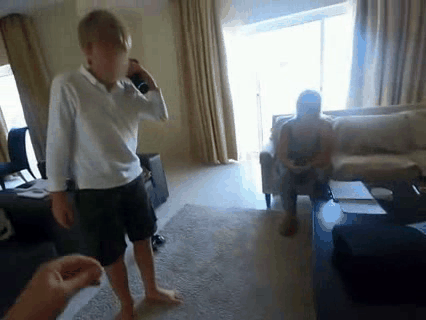

<Pred 5>
Timestamp: 361.75 ~ 373.40, IoU: 0.00


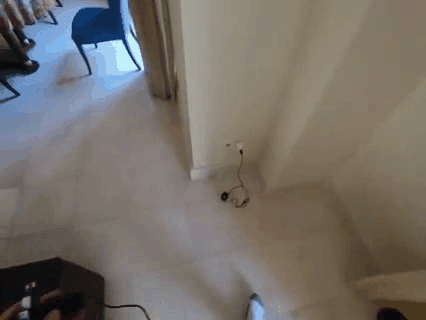

In [7]:
quids = sorted(val_quid2pred.keys())
num_quids = len(quids)
quid = quids[np.random.choice(num_quids)]

clip_uid = val_quid2ann[quid]['video_id']
gt_s = val_quid2info[quid]['clip_start_sec']
gt_e = val_quid2info[quid]['clip_end_sec']
gts = [gt_s, gt_e]
query = val_quid2info[quid]['query']
template = val_quid2info[quid]['template']
obj = val_quid2object[quid]
action = val_quid2action[quid]
gt_fno = [idx for idx in range(int(gt_s * 30), int(gt_e * 30))]
pred_timestamps = val_quid2pred[quid]
pred_fno_list = []

for pred in pred_timestamps:
    pred_fno = []
    for idx in range(int(pred[0] * 30), int(pred[1] * 30)):
        pred_fno.append(idx)
    pred_fno_list.append(pred_fno)
    
ann = val_quid2ann[quid]

p_clip = p_clips_dir / f'{clip_uid}.mp4'

###############################################################
# compute metrics
table, overlap = compute_result([pred_timestamps], [gt_s, gt_e])


###############################################################
# display
print(clip_uid, quid)
print(query)
print(f"Template: {template}")
print(f"Object: {obj}")
print(f"Action: {action}")
print(table)

gt_frames = get_pillow_images(p_clip, gt_fno)
pred_frames_list = [get_pillow_images(p_clip, pred_fno) for pred_fno in pred_fno_list]

print("<GT>")
print(f"GT: {gt_s:.2f} ~ {gt_e:.2f}")
gt_frames[0].save('/tmp/gt_nlq.gif', save_all=True, append_images=gt_frames[1:31], duration=0.001, loop=0)
display(IPImage('/tmp/gt_nlq.gif'))

for idx, (pred_frames, timestamp) in enumerate(zip(pred_frames_list, pred_timestamps)):
    print(f"<Pred {idx + 1}>")
    print(f"Timestamp: {timestamp[0]:.2f} ~ {timestamp[1]:.2f}, IoU: {float(overlap[:, idx]):.2f}")
    pred_frames[0].save(f'/tmp/nlq_pred_{idx + 1}.gif', save_all=True, append_images=pred_frames[1:31], duration=0.001, loop=0)
    display(IPImage(f'/tmp/nlq_pred_{idx + 1}.gif'))
    



### Template_stats

In [8]:
q_c = [
    "Objects: Where is object X before / after event Y?",
    "Place: Where did I put X?",
    "Objects: What did I put in X?",
    "Objects: What X did I Y?",
    "Objects: What X is Y?",
    "Objects: State of an object"
]

q_not_c = [
    "Objects: In what location did I see object X ?",
    "People: Who did I talk to in location X?",
    "Objects: Where is my object X?",
    "People: When did I talk to or interact with person with role X?"
]

etc = [
    "Objects: Where is object X?",
    "Objects: How many X’s? (quantity question)",
    "People: Who did I interact with when I did activity X?"
]

In [9]:
train_quid2pred, train_quid2info, train_quid2template, train_quid2object, train_quid2action, train_quid2ann = process_predictions_and_annotations(all_train_preds, all_train_anns, p_object_dir, p_action_dir)

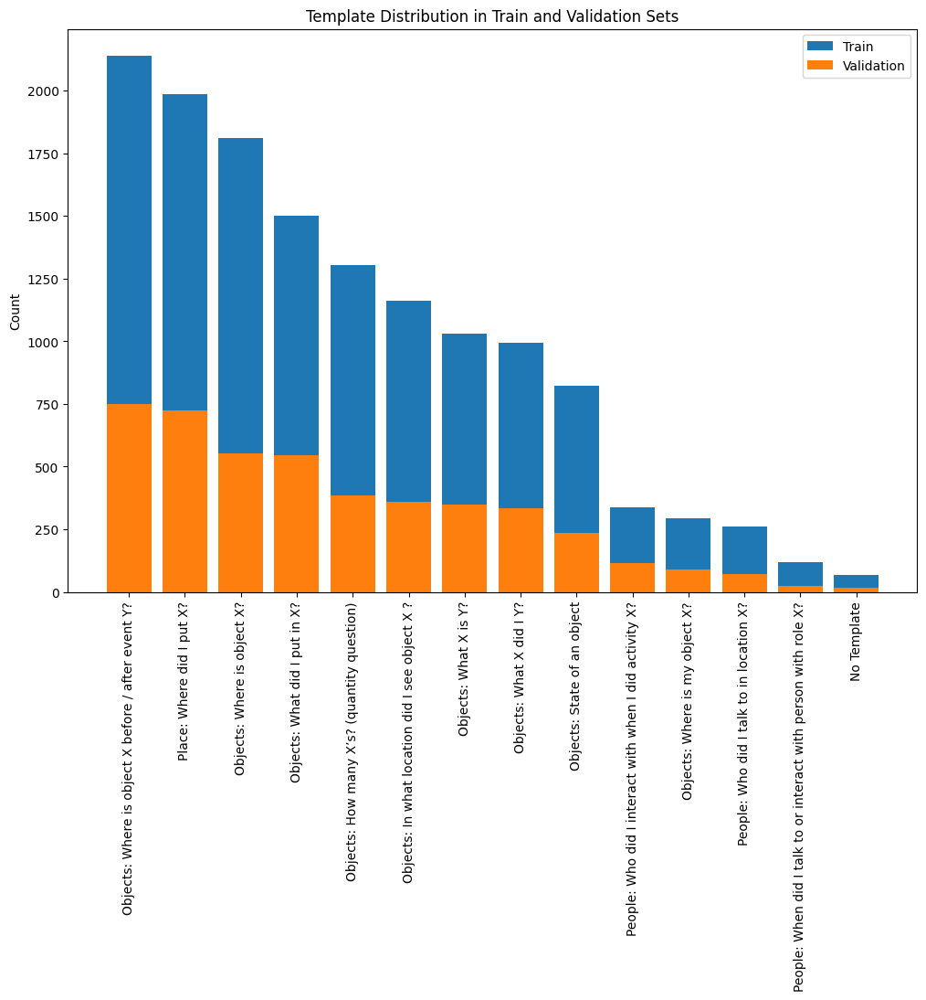

In [10]:
import matplotlib.pyplot as plt
from collections import Counter

# Assuming train_quid2template and val_quid2template are dictionaries
# Replace with the actual variable names used in your code

# Count occurrences in train and validation sets
train_template_counter = Counter(train_quid2template.values())
val_template_counter = Counter(val_quid2template.values())

train_df = pd.DataFrame.from_dict(train_template_counter, orient='index').reset_index()
train_df.columns = ['Template', 'train_count']
train_df = train_df.sort_values(by='train_count', ascending=False)
val_df = pd.DataFrame.from_dict(val_template_counter, orient='index').reset_index()
val_df.columns = ['Template', 'val_count']
val_df = val_df.sort_values(by='val_count', ascending=False)

plt.figure(figsize=(12, 8))

plt.bar(np.arange(len(train_df)), train_df['train_count'], label='Train')
plt.bar(np.arange(len(val_df)), val_df['val_count'], label='Validation')

plt.xticks(np.arange(len(train_df)), train_df['Template'], rotation=90)

plt.ylabel('Count')

plt.title('Template Distribution in Train and Validation Sets')

plt.legend()

plt.show()


In [31]:
q_c_count = 0
q_not_c_count = 0
etc_count = 0
no_teamplate = 0
verb_count = 0
template_list = []
query_class = {}
for quid in list(val_quid2template.keys()):
    q = val_quid2template[quid]
    
    if not 'People: Who did I interact with when I did activity X?' in q:
        continue
    if q in q_c:
        q_c_count += 1
        query_class[quid] = 'Exist object interacting with the #C'
    elif q in q_not_c:
        q_not_c_count += 1
        query_class[quid] = 'No exist object interacting with the #C'
    elif q in etc:
        if not val_quid2action[quid][0] == '':
            if q == "People: Who did I interact with when I did activity X?":
                if val_quid2action[quid][0] != 'interact':
                    template_list.append(q)
                    q_c_count += 1
                    query_class[quid] = 'Exist object interacting with the #C'
                else:
                    q_not_c_count += 1
                    query_class[quid] = 'No exist object interacting with the #C'
            else:
                q_c_count += 1
                query_class[quid] = 'Exist object interacting with the #C'
        else:
            q_not_c_count += 1
            query_class[quid] = 'No exist object interacting with the #C'
    else:
        no_teamplate += 1
        query_class[quid] = 'No Template'
        
print(f"Query related to #C: {q_c_count}")
print(f"Query not related to #C: {q_not_c_count}")
print(f"Query etc: {etc_count}")
print(f"No template: {no_teamplate}")
print(f"Total: {q_c_count + q_not_c_count + etc_count + no_teamplate}")

Query related to #C: 63
Query not related to #C: 52
Query etc: 0
No template: 0
Total: 115


In [30]:
def calculate_recall(quid2pred, quid2info, quid2target, quid2target_count, target = 'template'):
    preds = []  # N x 5 x 2
    target_list = []  # N
    gts = []  # N x 2

    # Populate preds, gts, and templates
    for quid in quid2pred.keys():
        if not 'People: Who did I interact with when I did activity X?' in val_quid2template[quid]:
            continue
        preds.append(quid2pred[quid])  # 5 x 2
        gts.append([quid2info[quid]['clip_start_sec'], quid2info[quid]['clip_end_sec']])  # 1
        target_list.append(quid2target[quid])  # 1

    preds = np.array(preds)
    target_list = np.array(target_list)
    gts = np.array(gts)[:, None]  # N x 1 x 2

    # Compute IoUs
    ious = compute_IoU(preds, gts)  # N x 5

    target_class = ['all']
    target_class.extend(list(quid2target_count.keys()))
    
    metrics = []
    for th in [.3, .5]:
        for k in [1, 5]:
            metric_name = f'R{k}@{th:.1f}'
            correct = (ious[..., :k] >= th).any(axis=-1)  # N

            # Calculate recall for each scene class
            for scene_class in target_class:
                mask = target_list == scene_class if scene_class != 'all' else slice(None)
                recall = correct[mask].mean()
                frequency = quid2target_count[scene_class]  # Get the frequency from query2scene_count
                metrics.append({
                    target: scene_class,
                    'metric': metric_name,
                    'recall': recall,
                    'frequency': frequency
                })

    # Create DataFrame and pivot
    df = pd.DataFrame(metrics).pivot(index=target, columns='metric', values='recall')

    # Sort the DataFrame based on the frequency
    df['frequency'] = df.index.map(quid2target_count)  # Add frequency as a column
    df = df.sort_values(by='frequency', ascending=False)  # Sort by frequency
    df = df.drop(columns=['frequency'])  # Drop the frequency column after sorting

    # Multiply by 100 and round to 2 decimal places
    df = (100 * df).round(2)

    return df


In [32]:
test = calculate_recall(val_quid2pred, val_quid2info, query_class, Counter(query_class.values()), target='Object & #C')
# test = test.drop(index='No Template')
test

metric,R1@0.3,R1@0.5,R5@0.3,R5@0.5
Object & #C,,,,
Exist object interacting with the #C,11.11,6.35,34.92,20.63
No exist object interacting with the #C,15.38,9.62,30.77,21.15
all,13.04,7.83,33.04,20.87


In [97]:
test2 = pd.DataFrame()

metric,R1@0.3,R1@0.5,R5@0.3,R5@0.5
metric,,,,
R1@0.3,1.000000,0.999972,0.999985,1.000000
R1@0.5,0.999972,1.000000,0.999918,0.999967
R5@0.3,0.999985,0.999918,1.000000,0.999989
R5@0.5,1.000000,0.999967,0.999989,1.000000


In [35]:
# Assuming train_quid2template and val_quid2template are defined
train_quid2template_count = Counter(train_quid2template.values())
val_quid2template_count = Counter(val_quid2template.values())

train_df = calculate_recall(train_quid2pred, train_quid2info, train_quid2template, train_quid2template_count)
val_df = calculate_recall(val_quid2pred, val_quid2info, val_quid2template, val_quid2template_count)

template_train_count_df = pd.DataFrame([train_quid2template_count], index=['count']).T
template_val_count_df = pd.DataFrame([val_quid2template_count], index=['count']).T

train_df = pd.concat([train_df, template_train_count_df], axis=1)
val_df = pd.concat([val_df, template_val_count_df], axis=1)

val_df.loc['all', 'count'] = len(val_quid2template)

val_df
# train_df

,R1@0.3,R1@0.5,R5@0.3,R5@0.5,count
Objects: Where is object X before / after event Y?,21.20,13.33,43.73,29.60,750.0
Place: Where did I put X?,15.86,8.83,36.14,23.45,725.0
Objects: Where is object X?,7.97,4.17,21.74,13.95,552.0
Objects: What did I put in X?,17.22,12.27,41.58,31.50,546.0
Objects: How many X’s? (quantity question),16.32,11.92,34.97,26.68,386.0
Objects: In what location did I see object X ?,6.96,4.46,20.61,13.93,359.0
Objects: What X did I Y?,17.14,10.00,32.29,20.57,350.0
Objects: What X is Y?,13.25,8.13,28.92,18.98,332.0
Objects: State of an object,23.83,15.32,47.66,33.62,235.0
People: Who did I interact with when I did activity X?,13.04,7.83,33.04,20.87,115.0


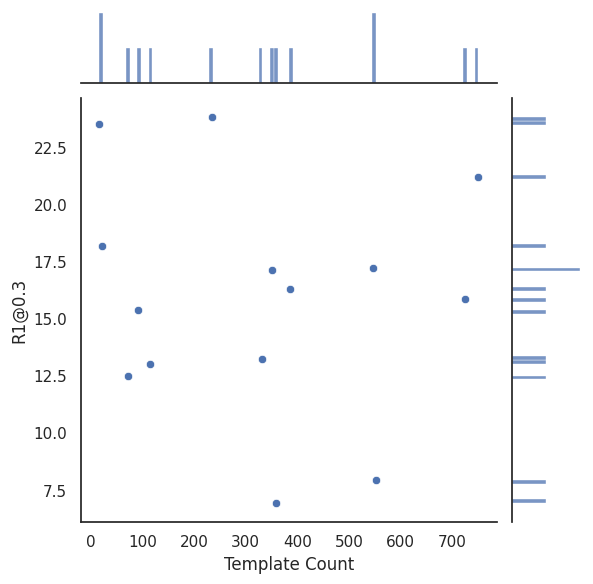

In [73]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

data = pd.DataFrame({
    'R1@0.3': list(val_df['R1@0.3'].drop('all')),
    'Template Count': list(val_df['count'].drop('all')),
})
sns.set(style="white", color_codes=True)
g = sns.jointplot(x='Template Count', y='R1@0.3', data=data, kind='scatter', marginal_kws=dict(bins=100, fill=True))

plt.show()


In [74]:
# correlation coefficient between template count and recall

data.corr()

,R1@0.3,Template Count
R1@0.3,1.00000,-0.10533
Template Count,-0.10533,1.00000


### Object_stats

In [59]:
from collections import Counter
import pandas as pd


p_obj_dict = Path('/data/soyeonhong/GroundVQA/obj_dict/obj_dict_50.json')
obj_dict = json.loads(p_obj_dict.read_text())

def get_object_counts(quid2object):
    obj_all = []

    # Collect all non-empty objects
    for key in quid2object.keys():
        for obj in quid2object[key]:
            # if obj:
            #     obj_all.append(obj)
            if obj:  # Check if object is not an empty string
                for key in obj_dict.keys():
                    if obj in obj_dict[key]:                
                        obj_all.append(key)
                        break

    # Count occurrences of each object
    obj_count = Counter(obj_all)

    # Configure pandas to display full column width
    pd.set_option('display.max_colwidth', None)

    # Create DataFrame from the object counts dictionary
    df = pd.DataFrame.from_dict(obj_count, orient='index').reset_index()
    df.columns = ['object', 'count']

    # Sort DataFrame by count in descending order
    df = df.sort_values(by='count', ascending=False)
    
    obj_set = set(obj_all)

    return df, obj_count, obj_set

train_df_obj, train_obj_count, train_obj_set = get_object_counts(train_quid2object)
val_df_obj, val_obj_count, val_obj_set = get_object_counts(val_quid2object)

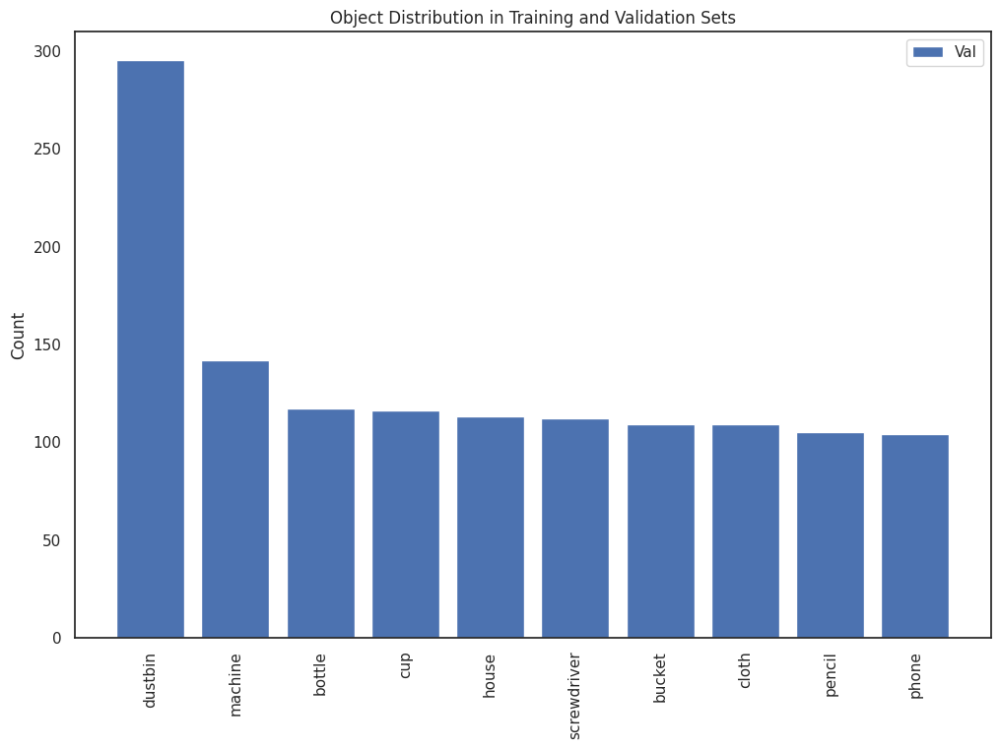

In [60]:
plt.figure(figsize=(12, 8))

# plt.bar(np.arange(10), train_df_obj['count'][:10], label='Train')
plt.bar(np.arange(10), val_df_obj['count'][:10], label='Val')

plt.xticks(np.arange(10), train_df_obj['object'][:10], rotation=90)

plt.ylabel('Count')

plt.title('Object Distribution in Training and Validation Sets')

plt.legend()

plt.show()

In [25]:
# TODO: 이거 제대로 필터링 안됨
# in_val = train_obj_set.intersection(val_obj_set)
# not_in_train = val_obj_set - train_obj_set

# print(f"Number of objects in train but not in val: {len(not_in_train)}")
# print(f"Number of objects in val but not in train: {len(in_val)}")

In [26]:
# from wordcloud import WordCloud
# import matplotlib.pyplot as plt
# import pandas as pd

# word_freq = dict(zip(train_df_obj['object'], train_df_obj['count']))

# # Generate the word cloud
# wordcloud = WordCloud(width=800, height=400, background_color='black', colormap='viridis').generate_from_frequencies(word_freq)

# # Plotting the word cloud
# plt.figure(figsize=(10, 5))
# plt.imshow(wordcloud, interpolation='bilinear')
# plt.axis('off')
# plt.title('Training Object Frequency', fontsize=10)
# plt.show()


In [71]:
val_R1_03 = 15.51
val_R1_05 = 9.75
val_R5_03 = 34.47
val_R5_05 = 23.62

target = 'object'
split = 'val'
if split == 'train':
    quid2pred = train_quid2pred
    quid2info = train_quid2info
    quid2target = train_quid2object
    quid2target_count = train_obj_count
else:
    quid2pred = val_quid2pred
    quid2info = val_quid2info
    quid2target = val_quid2object
    quid2target_count = val_obj_count
    
preds = []  # N x 5 x 2
target_list = []  # N
gts = []  # N x 2

# Populate preds, gts, and templates
for quid in quid2pred.keys():
    for target in quid2target[quid]:
    
        preds.append(quid2pred[quid])  # 5 x 2
        gts.append([quid2info[quid]['clip_start_sec'], quid2info[quid]['clip_end_sec']])  # 1
        target_list.append(target)  # 1

preds = np.array(preds)
target_list = np.array(target_list)
gts = np.array(gts)[:, None]  # N x 1 x 2

# Compute IoUs
ious = compute_IoU(preds, gts)  # N x 5

metrics = []
for th in [.3, .5]:
    for k in [1, 5]:
        metric_name = f'R{k}@{th:.1f}'
        correct = (ious[..., :k] >= th).any(axis=-1)  # N

        # Calculate recall for each scene class
        for target_class in list(quid2target_count.keys()):
            mask = target_list == target_class if target_class != 'all' else slice(None)
            
            # print(f"correct[mask]: {correct[mask]}, target_class: {target_class}")
            recall = correct[mask].mean()
            frequency = quid2target_count[target_class]  # Get the frequency from query2scene_count
            metrics.append({
                'object': target_class,
                'metric': metric_name,
                'recall': recall,
                'frequency': frequency
            })

# Create DataFrame and pivot
df = pd.DataFrame(metrics).pivot(index='object', columns='metric', values='recall')

# Sort the DataFrame based on the frequency
df['frequency'] = df.index.map(train_obj_count)  # Add frequency as a column
df = df.sort_values(by='frequency', ascending=False)  # Sort by frequency
df = df.drop(columns=['frequency'])  # Drop the frequency column after sorting

# Multiply by 100 and round to 2 decimal places
df = (100 * df).round(2)

# Calculate the differences and add new columns
# df['R1@0.3_diff'] = df['R1@0.3'] - val_R1_03
# df['R1@0.5_diff'] = df['R1@0.5'] - val_R1_05
# df['R5@0.3_diff'] = df['R5@0.3'] - val_R5_03
# df['R5@0.5_diff'] = df['R5@0.5'] - val_R5_05



df = pd.concat([df, pd.DataFrame([quid2target_count], index=['count']).T], axis=1)
df = df.drop(columns=['count'])
df.head(10)

,R1@0.3,R1@0.5,R5@0.3,R5@0.5
dustbin,23.08,15.38,38.46,30.77
machine,21.74,17.39,30.43,21.74
bottle,23.40,17.02,38.30,34.04
cup,19.05,19.05,47.62,28.57
house,5.88,5.88,29.41,17.65
screwdriver,5.00,5.00,10.00,5.00
bucket,7.55,3.77,22.64,16.98
cloth,25.93,14.81,37.04,22.22
pencil,33.33,11.11,33.33,11.11
phone,37.65,21.18,58.82,41.18


In [75]:
df.tail(10)

,R1@0.3,R1@0.5,R5@0.3,R5@0.5
tray,16.67,6.67,46.67,33.33
shelf,20.00,20.00,45.00,30.00
chopsticks,16.67,16.67,33.33,27.78
cabinet,37.50,18.75,43.75,18.75
paper,25.00,15.00,40.00,25.00
frying pan,29.41,29.41,41.18,35.29
scissors,0.00,0.00,33.33,23.81
cupboard,25.00,10.00,65.00,25.00
dough,7.41,7.41,25.93,11.11
drawer,28.57,17.14,60.00,42.86


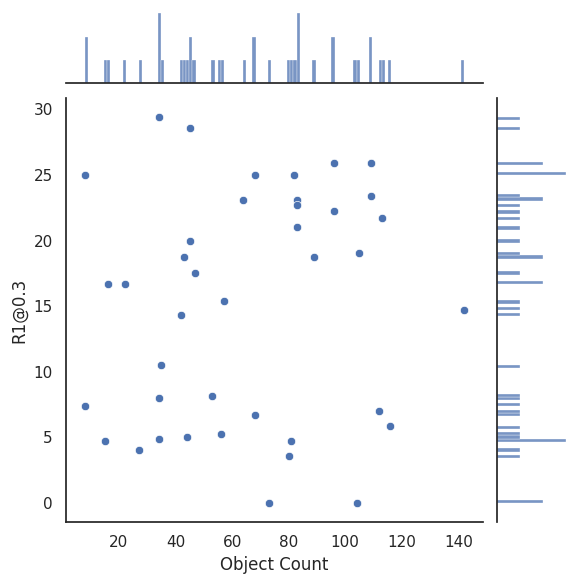

In [85]:
# jointplot

data = pd.DataFrame({
    'R1@0.3': list(df['R1@0.3']),
    'Object Count': list(quid2target_count.values()),
})

filtered_data = data[(data['Object Count'] <= 250) & (data['R1@0.3'] <= 30)]

sns.set(style="white", color_codes=True)
g = sns.jointplot(x='Object Count', y='R1@0.3', data=filtered_data, kind='scatter', marginal_kws=dict(bins=120, fill=True))
plt.show()

In [86]:
# correlation coefficient between object count and recall
filtered_data.corr()

,R1@0.3,Object Count
R1@0.3,1.000000,0.119084
Object Count,0.119084,1.000000
